In [74]:
# importing libraries
%matplotlib inline
from azureml import Workspace
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#datasource
ws = Workspace()
ds = ws.datasets['wdbc1.csv']
breast_cancer = ds.to_dataframe()


In [75]:
breast_cancer.describe()


,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [76]:
print(breast_cancer)

           id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0      842302         M       17.990         10.38          122.80     1001.0   
1      842517         M       20.570         17.77          132.90     1326.0   
2    84300903         M       19.690         21.25          130.00     1203.0   
3    84348301         M       11.420         20.38           77.58      386.1   
4    84358402         M       20.290         14.34          135.10     1297.0   
5      843786         M       12.450         15.70           82.57      477.1   
6      844359         M       18.250         19.98          119.60     1040.0   
7    84458202         M       13.710         20.83           90.20      577.9   
8      844981         M       13.000         21.82           87.50      519.8   
9    84501001         M       12.460         24.04           83.97      475.9   
10     845636         M       16.020         23.24          102.70      797.8   
11   84610002         M     

# Data Preprocessing

In [77]:
breast_cancer.shape

(569, 32)

In [78]:
breast_cancer.isnull().sum() 

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [8]:
#drop the ID
breast_cancer.drop('id', axis=1 , inplace=True)
breast_cancer.shape

(569, 31)

In [9]:
print(breast_cancer)

    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0           M       17.990         10.38          122.80     1001.0   
1           M       20.570         17.77          132.90     1326.0   
2           M       19.690         21.25          130.00     1203.0   
3           M       11.420         20.38           77.58      386.1   
4           M       20.290         14.34          135.10     1297.0   
5           M       12.450         15.70           82.57      477.1   
6           M       18.250         19.98          119.60     1040.0   
7           M       13.710         20.83           90.20      577.9   
8           M       13.000         21.82           87.50      519.8   
9           M       12.460         24.04           83.97      475.9   
10          M       16.020         23.24          102.70      797.8   
11          M       15.780         17.89          103.60      781.0   
12          M       19.170         24.80          132.40     1123.0   
13    

In [79]:
breast_cancer["diagnosis"].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

# Data Visualization - Pair Plot

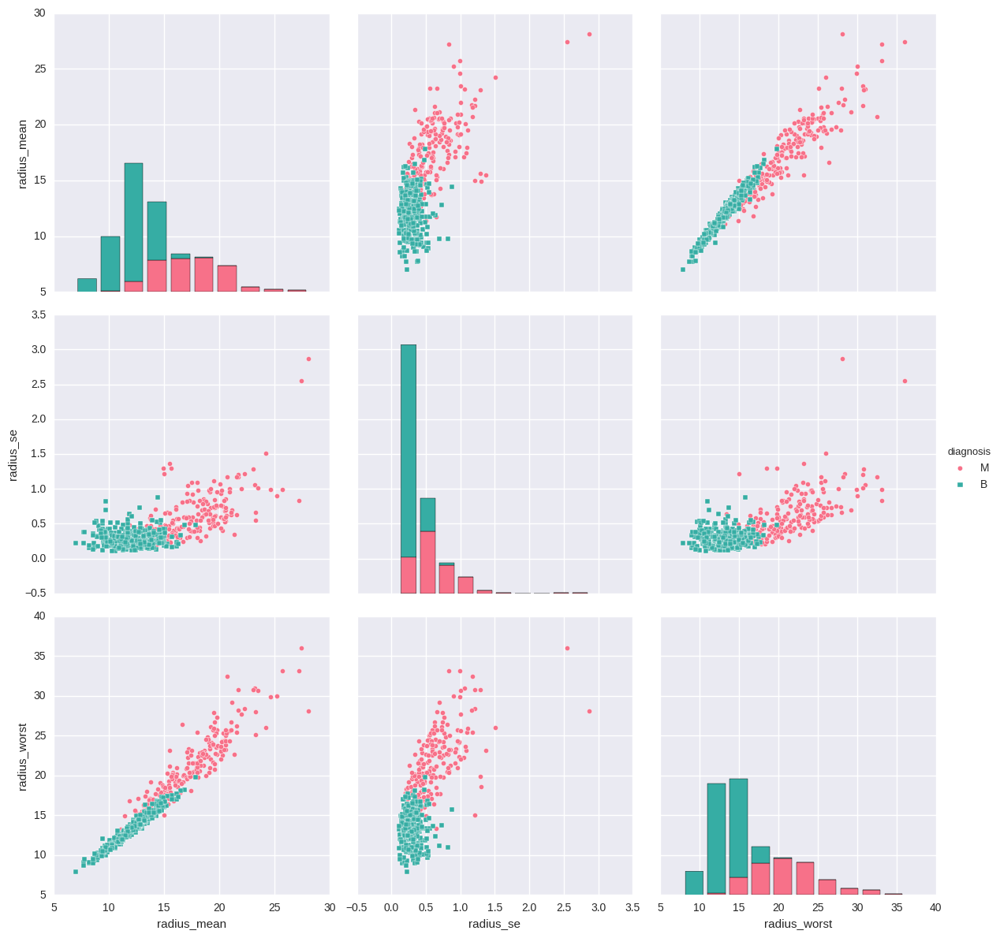

In [80]:
radius = breast_cancer[['radius_mean','radius_se','radius_worst','diagnosis']]
sns.pairplot(radius, hue='diagnosis',palette="husl", markers=["o", "s"],size=4)

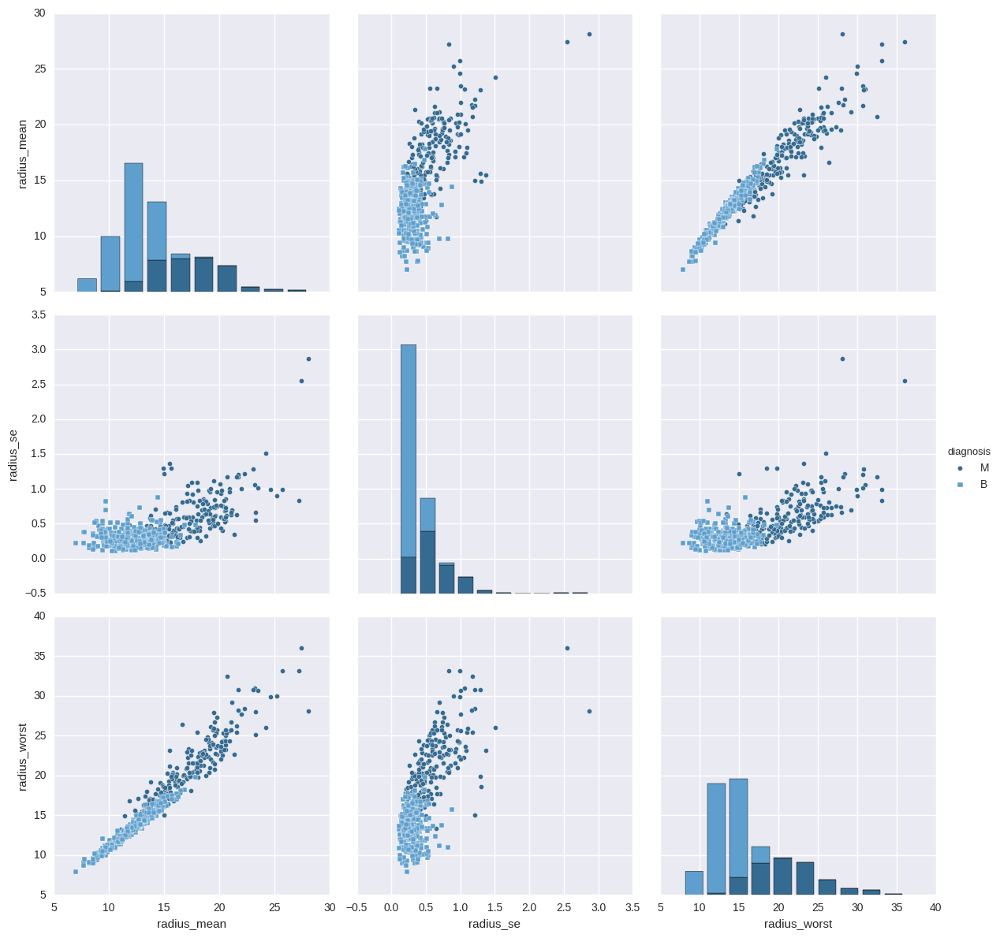

In [12]:
texture = breast_cancer[['texture_mean','texture_se','texture_worst','diagnosis']]
sns.pairplot(radius, hue='diagnosis',palette="Blues_d", markers=["o", "s"],size=4)

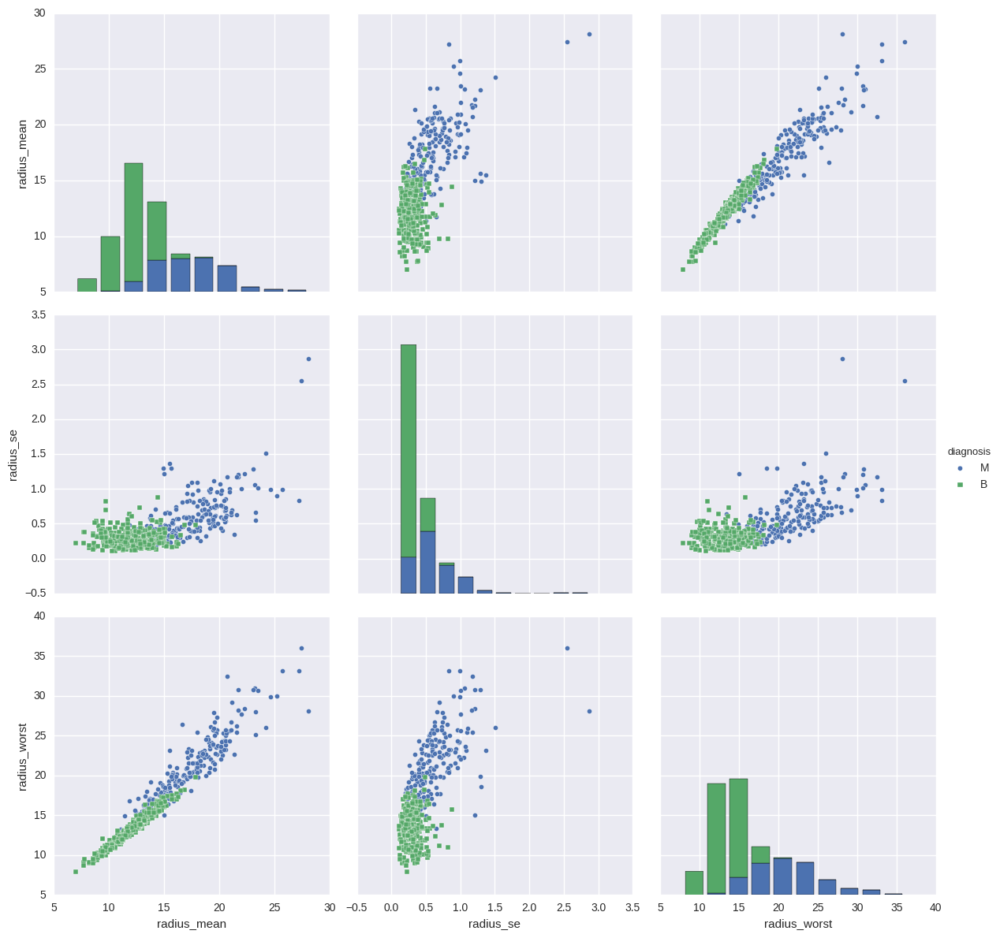

In [81]:
perimeter = breast_cancer[['perimeter_mean','perimeter_se','perimeter_worst','diagnosis']]
sns.pairplot(radius, hue='diagnosis', markers=["o", "s"],size=4)

In [82]:
#Mapping Benign to 0 and Malignant to 1 
breast_cancer['diagnosis'] = breast_cancer['diagnosis'].map({'M':1,'B':0})

IndexError: index 15 is out of bounds for axis 0 with size 15

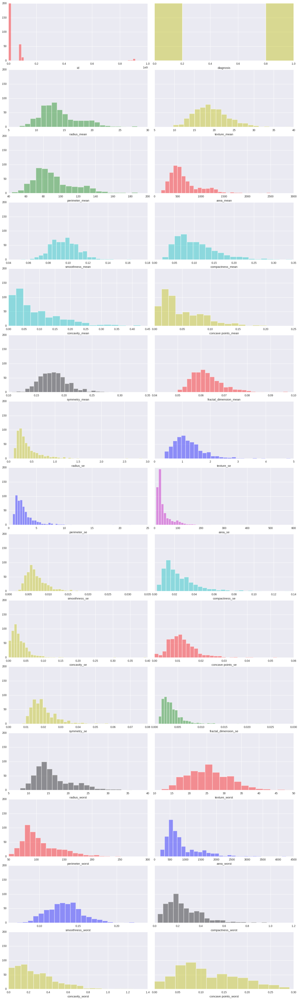

In [83]:
#breast_cancer["diagnosis"].value_counts()
colors = np.array('b g r c m y k'.split())

fig,axes = plt.subplots(nrows =15,ncols=2, sharey=True,figsize = (15,50))
plt.tight_layout()
row = 0
iteration = 0
for j in range(0,len(breast_cancer.columns[:-1])):
    iteration+=1
    if(j%2==0):
        k = 0
    else:
        k = 1
    sns.distplot(breast_cancer[breast_cancer.columns[j]],kde=False,hist_kws=dict(edgecolor="w", linewidth=2),color = np.random.choice(colors) ,ax=axes[row][k])
    if(iteration%2==0):
        row+=1
        plt.ylim(0,200)

# Histogram

In [84]:
#The features looks they are broken into three main categories, value means, standard deivations, and 'worst'.
#We can check to see if there are any correlations between these subsets of features
features_mean = breast_cancer.columns[1:10]
features_se = breast_cancer.columns[10:20]
features_worst = breast_cancer.columns[20:30]

In [85]:
print( features_mean)
print(features_se)
print(features_worst)

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean'],
      dtype='object')
Index(['symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
       'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se',
       'concavity_se', 'concave points_se'],
      dtype='object')
Index(['symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst'],
      dtype='object')


In [91]:
#print(breast_cancer)
# Separate out malignant and benign data for graphing
mal = breast_cancer[breast_cancer['diagnosis'] ==1]
ben = breast_cancer[breast_cancer['diagnosis'] ==0]

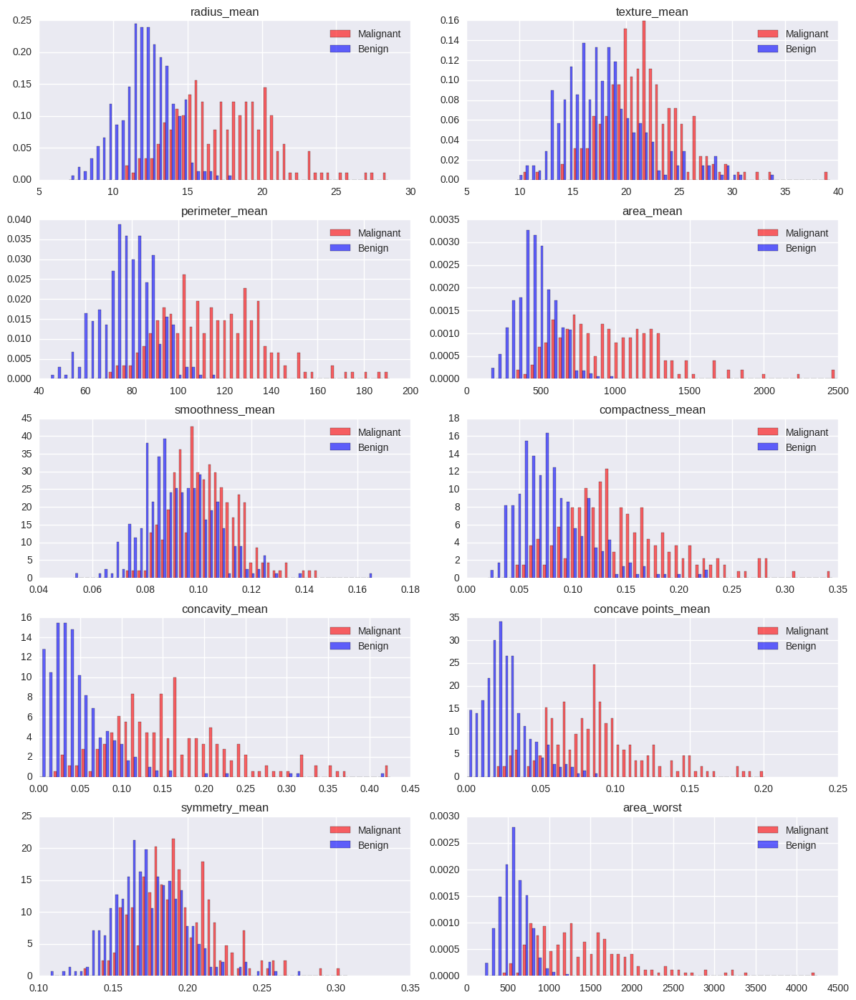

In [105]:
# Column names to observe in following graphs - mean values only
observe = list(breast_cancer.columns[2:11]) + ['area_worst']  #+ ['perimeter_worst'] 
observab = breast_cancer.loc[:,observe]


plt.rcParams.update({'font.size': 8})
plot, graphs = plt.subplots(nrows=5, ncols=2, figsize=(12,14))
graphs = graphs.flatten()
for idx, graph in enumerate(graphs):
    graph.figure
    
    binwidth= (max(breast_cancer[observe[idx]]) - min(breast_cancer[observe[idx]]))/50
    bins = np.arange(min(breast_cancer[observe[idx]]), max(breast_cancer[observe[idx]]) + binwidth, binwidth)
    graph.hist([mal[observe[idx]],ben[observe[idx]]], bins=bins, alpha=0.6, normed=True, label=['Malignant','Benign'], color=['red','blue'])
    graph.legend(loc='upper right')
    graph.set_title(observe[idx])
plt.tight_layout()

# Scatter plot  

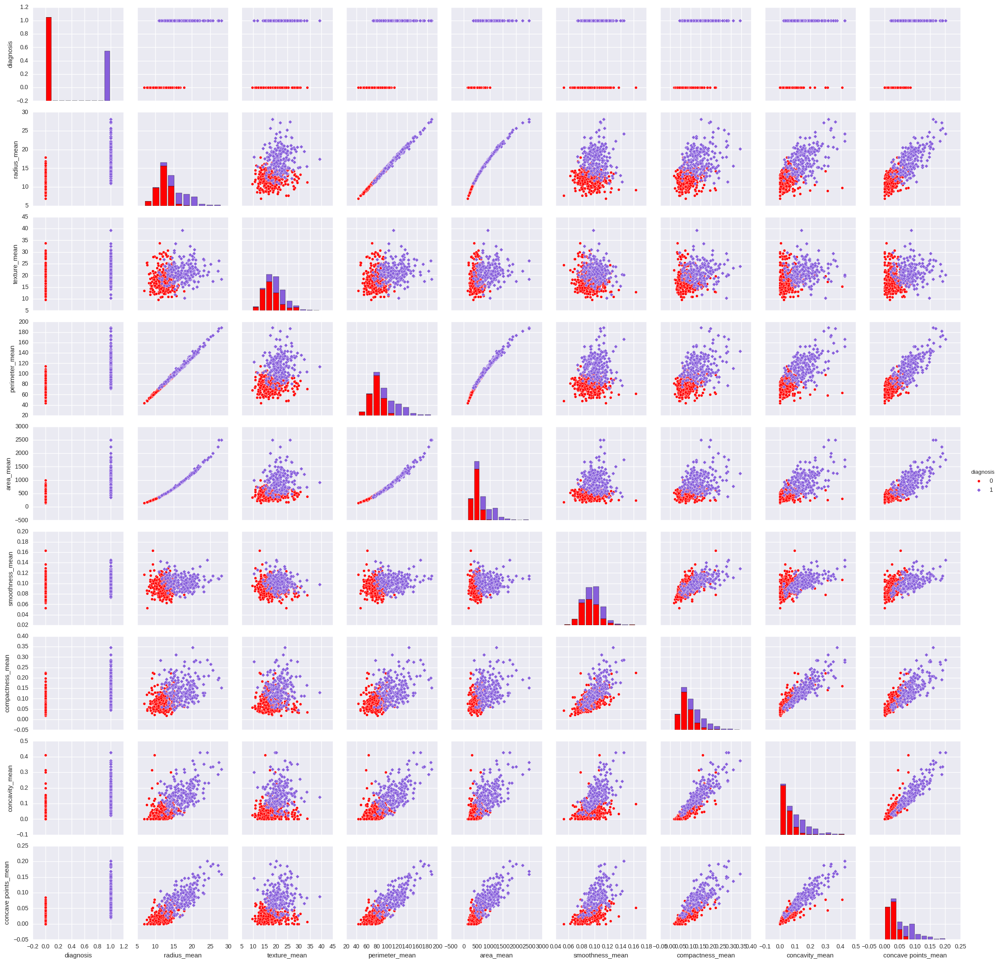

In [120]:
#features_mean / features_se / features_worst
# Variables chosen from Random Forest modeling.
sns.pairplot(breast_cancer,
             x_vars = features_mean,
             y_vars = features_mean,
             hue = 'diagnosis', 
             palette = ('Red', '#875FDB'), 
             markers=["o", "D"])

In [121]:
features = breast_cancer.columns[1:30]
sns.pairplot(breast_cancer,
             x_vars = features,
             y_vars = features,
             hue = 'diagnosis', 
             palette = ('Red', '#875FDB'), 
             markers=["o", "D"])

# Boxplots

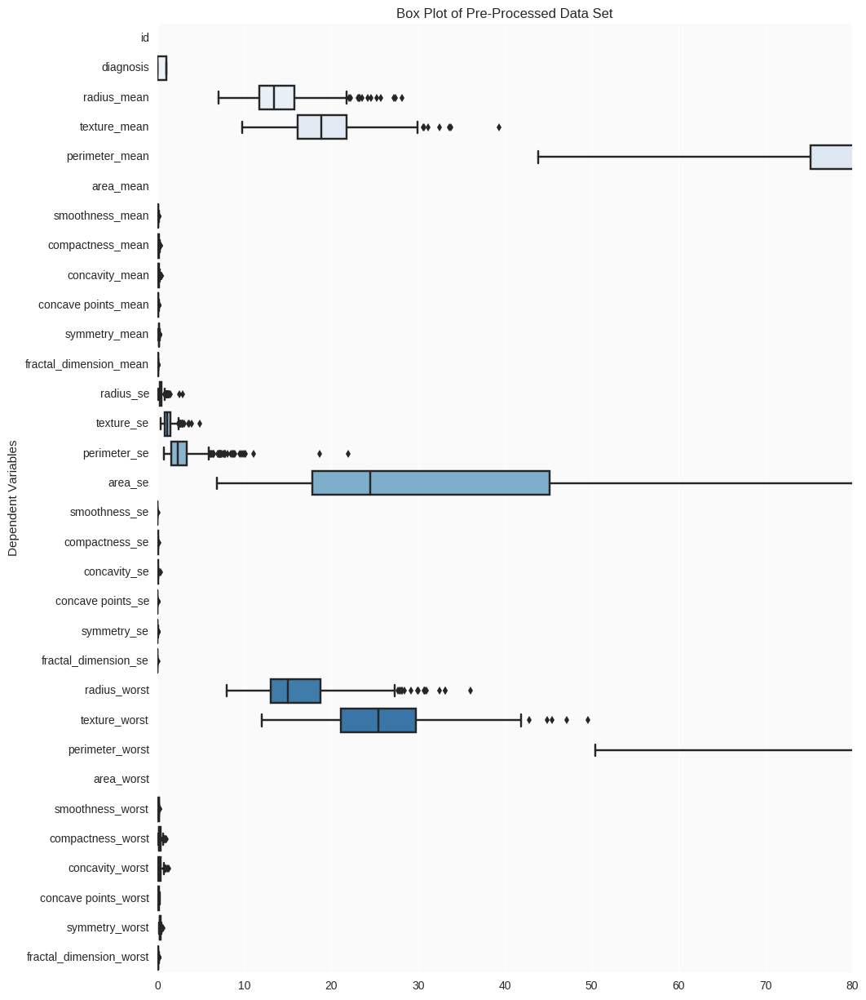

In [128]:
f, ax = plt.subplots(figsize=(11, 15))

ax.set_axis_bgcolor('#fafafa')
ax.set(xlim=(-.05, 80))
plt.ylabel('Dependent Variables')
plt.title("Box Plot of Pre-Processed Data Set")
ax = sns.boxplot(data = breast_cancer, 
  orient = 'h', 
  palette = "Blues")